### Лаборторна 1
### Виконав: Боднар Остап, КН-413

In [1]:
import itertools

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm

In [2]:
def create_box_plot_kernel(shape_x, shape_y):
    return 1 / (shape_x * shape_y) * np.full((shape_x, shape_y), 1)

In [12]:
def _calculate_padding(kernel):
    k_height, k_width = kernel.shape
    return ((int(k_height / 2), int(k_height / 2) - (1 if k_height % 2 == 0 else 0) ),
             (int(k_width / 2), int(k_width / 2) - (1 if k_height % 2 == 0 else 0)))


def apply_kernel_to_2d_matrix(matrix, kernel, grouping_func=np.sum):
    m_height, m_width = matrix.shape
    padded = np.pad(matrix, _calculate_padding(kernel))

    slided_window_elements = np.lib.stride_tricks.sliding_window_view(padded, kernel.shape) * kernel

    output = grouping_func(slided_window_elements.reshape(
        (m_height, m_width, kernel.shape[0] * kernel.shape[1])
    ), axis=-1)
    return output


def apply_kernel_to_image(img, kernel, grouping_func=np.sum):
    image_arr = np.array(img)
    processed_image_array = []
    for rgb_layer in range(image_arr.shape[2]):
        current_layer = image_arr[:, :, rgb_layer]

        processed_layer = apply_kernel_to_2d_matrix(current_layer, kernel, grouping_func)
        processed_image_array.append(processed_layer)
    return Image.fromarray(np.dstack(processed_image_array).astype(np.uint8))

In [4]:
def plot_comparison_matrix(image_names, kernel_sizes, figsize=None):
    fig, axes = plt.subplots(len(kernel_sizes), len(image_names), figsize=figsize or (30, 50))

    for (kernel_size, image_name), ax in zip(tqdm(list(itertools.product(kernel_sizes, image_names))), axes.flatten()):
        img = Image.open(f"images/input/{image_name}")
        kernel = create_box_plot_kernel(*kernel_size)
        processed_image = apply_kernel_to_image(img, kernel)

        processed_image.save(f"images/output/{'_'.join(map(str, kernel_size))}_{image_name}")

        ax.imshow(processed_image)
        ax.axis('off')
        ax.set_title(f"{image_name}, {kernel_size}", fontsize=20)



    plt.show()


In [5]:
contrast_image_names = ["low_contrast.png", "high_contrast.jpg"]
detailed_image_names = ["low_detailed.jpg", "high_detailed.png"]
kernel_sizes = [(1, 1), (3, 3), (5, 5), (10, 10)]

  0%|          | 0/8 [00:00<?, ?it/s]

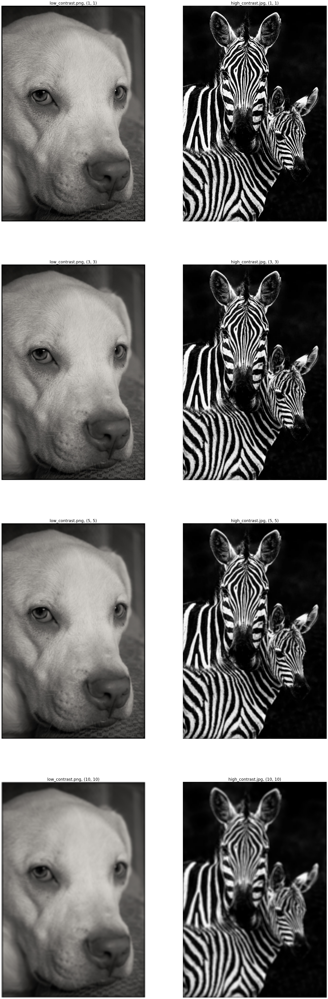

In [7]:
plot_comparison_matrix(contrast_image_names, kernel_sizes, (30, 90))

  0%|          | 0/8 [00:00<?, ?it/s]

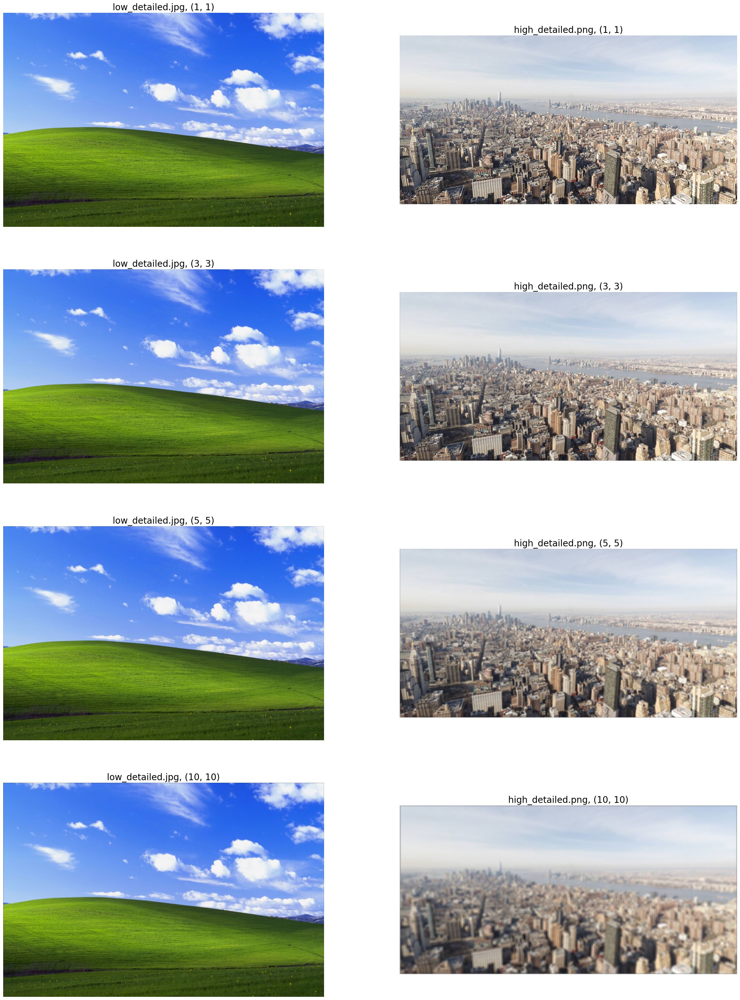

In [8]:
plot_comparison_matrix(detailed_image_names, kernel_sizes, (30, 40))

### Висновки

Із результатів роботи, можна зробити висновок, що цим більше ядро, тим більше розмивається зображення, що  і варто було очікувати, оскільки із збільшенням розміру ядра, збільшується кількість пікселів, яка залучається для створеня нового. Однак, проблемою збільшення розміру ядра є швидкість обрахунку, вона збільшується із збільшеням розміру ядра та/або розміру зображення.

Варто зайуважити, що використання box-фільтрації малопомітне на низько деталізованій картиці, і навпаки, надзвичайно помітне на дуже деталізованій.

Якщо ж говорити про контрастне та не контрастне зображення, то очевидно із більшою кількістю контрасту, розмивання стає видно краще, оскільки різких переходів більше, та навкпки із менш контрасним фото. Ці результати і видно на виведених оброблених зображенях

In [10]:
hc_image = np.array(Image.open("images/input/high_contrast.jpg"))

morf_kernel = np.full((3,3), 1, dtype=np.uint8)


def erosion(img, kernel):
    return apply_kernel_to_image(img, kernel, np.min)

def delation(img, kernel):
    return apply_kernel_to_image(img, kernel, np.max)

def morf_gradient(img, kernel):
    erosion_result = np.array(erosion(img, kernel))
    delation_result = np.array(delation(img, kernel))

    delation_result[delation_result > (255 / 2)] = 1
    delation_result[erosion_result > (255 / 2)] = 0

    return Image.fromarray(delation_result)

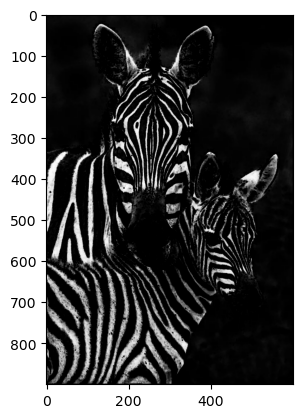

In [14]:
plt.imshow(erosion(hc_image, morf_kernel))

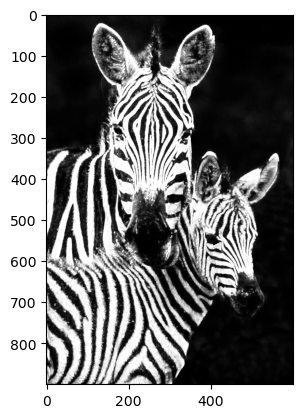

In [15]:
plt.imshow(delation(hc_image, morf_kernel))

Morphological Gradient

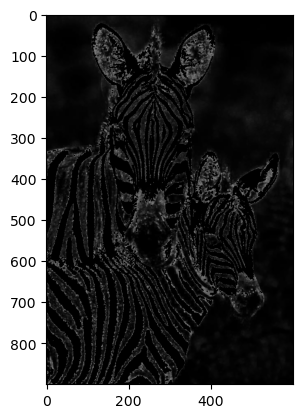

In [16]:
plt.imshow(morf_gradient(hc_image, morf_kernel))